# Sample generator

In [1]:
import os
import io
import sys
import zipfile

import IPython.display as ipd

from numpy import *
from matplotlib.pyplot import *
from matplotlib import rcParams
from scipy.io import wavfile
from scipy import signal
from collections import namedtuple
from numba import jit

rcParams['figure.figsize'] = 10, 4
sys.path.append("..")

from samplegen import *
%load_ext autoreload
%autoreload 2

## Convert to Bitwig Multisample

In [2]:
volca_c3 = sample_t(
    filename = "/home/soren/vcs/sbnsampler/app/sound/volca_c3.wav",
    note_root = 60,
    note_max = 127,
    note_min = 0,
    loop_start = 26592,
    loop_stop = 70614,
)

bitwig.write_single("volca_c3.multisample", volca_c3)

In [3]:
volca_c4 = sample_t(
    filename = "/home/soren/vcs/sbnsampler/app/sound/volca_c4.wav",
    note_root = 72,
    note_max = 127,
    note_min = 0,
    loop_start = 26538,
    loop_stop = 70618,
)

bitwig.write_single("volca_c4.multisample", volca_c4)

## Find loop points

In [2]:
def zcd(x, rising=True):
    # Find all indexes just before a zero-crossing
    if rising:
        return where(0 < diff(sign(x)))[0]
    else:
        return where(0 > diff(sign(x)))[0]

def moving_average(x, w):
    return convolve(x, ones(w), "same") / w

def find_loop_points_simple(x, fs, start_range, stop_range, averages=1, rising=True, visualize=0):
    # Apply some averaging before finding zero crossings
    x = moving_average(x, averages)
    
    # Ranges to search for loop points in
    N = len(x)
    start_range = [int(X*N) for X in start_range]
    stop_range = [int(X*N) for X in stop_range]
    
    # Find zero-crossings
    zc = zcd(x, rising=rising)
    
    # Approximate frequency
    #f = fs/max(diff(zc))
    #print(f)
    
    # Find the closest-to-zero zero-crossing within start and stop range
    zc_start = min([X for X in zc if ((start_range[0]<=X) & (X<=start_range[1]))])
    zc_stop = min([X for X in zc if ((stop_range[0]<=X) & (X<=stop_range[1]))])

    return zc_start, zc_stop

def player(x, fs):
    ipd.display(ipd.Audio(data=x, rate=fs))
    
def player_looped(x, fs, loop_start, loop_stop, samples=300):
    y = hstack([
        x[0:loop_stop],
        x[loop_start:loop_stop],
        x[loop_start:loop_stop],
        x[loop_start:],
    ])
    ipd.display(ipd.Audio(data=y, rate=fs))
    fig, (ax1, ax2, ax3) = subplots(3, 1, figsize=[10, 12])
    t = arange(len(x))/len(x)
    
    ax1.plot(t, x)
    ax1.axvspan((loop_start-samples/2)/len(x), (loop_start+samples/2)/len(x), color="k")
    ax1.axvspan((loop_stop-samples/2)/len(x), (loop_stop+samples/2)/len(x), color="k")
    ax1.set_ylabel("Sample and loop points")
    
    n = arange(samples, dtype=int) - samples//2
    y = (x[n+loop_start] - x[n+loop_stop]) / (2*max(x))
    ax2.plot(y)
    ax2.set_ylim(-1, 1)
    ax2.set_ylabel("Loop start - Loop stop")
    
    n = arange(300, dtype=int) - 300//2
    ax3.plot(n, x[n+loop_start])
    ax3.plot(n, x[n+loop_stop])
    ax3.set_ylabel("Overlayed start and stop")

def bitwig_loop_and_save_simple(input_file, output_file, start_range, stop_range, note_root, rising=True):
    fs, x = wavfile.read(input_file)
    l0, l1 = find_loop_points_simple(x, fs, start_range, stop_range, averages=1, rising=rising)
    player_looped(x, fs, l0, l1)

    bitwig.write_single(
        output_file,
        sample_t(
            filename = input_file,
            note_root = note_root,
            note_max = 127,
            note_min = 0,
            loop_start = l0,
            loop_stop = l1,
        ),
    )

%matplotlib inline
def find_loop_points_complex(x, start, N):
    #start = 50000 # Minimum start sample
    #N = 10000 # Samples to compute correlation for [num samples]
    #d = 10000 # Minimum start-stop distance [num samples]
    
    L = len(x)
    R = zeros(L)
    
    z = zcd(x, rising=True)
    
    # Extract first part of correlation
    start = z[argmax(z>start)]
    x1 = x[start-N//2: start+N//2]
    
    # Loop through all other zero crossings and compute a correlation for each
    for n in z[(start < z) & (z < L-N)]:
        x2 = x[n-N//2 : n+N//2]
        R[n] = sum(x1 * x2)

    l0 = start
    l1 = argmax(abs(R))
    return l0, l1

def bitwig_loop_and_save_complex(input_file, output_file, start, overlap, note_root):
    fs, x = wavfile.read(input_file)
    l0, l1 = find_loop_points_complex(x, start, overlap)
    player_looped(x, fs, l0, l1, overlap)
    print("Loop points: {:d}, {:d}".format(l0, l1))

    bitwig.write_single(
        output_file,
        sample_t(
            filename = input_file,
            note_root = note_root,
            note_max = 127,
            note_min = 0,
            loop_start = l0,
            loop_stop = l1,
        ),
    )

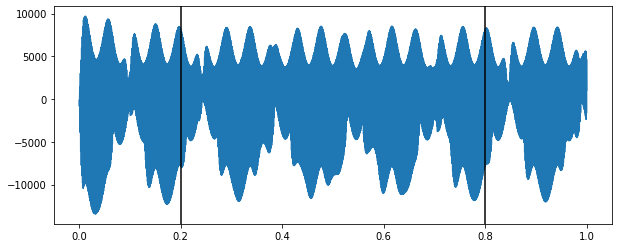

In [16]:
bitwig_loop_and_save_simple(
    input_file = "/home/soren/Dropbox/instruments/samples/vintage_synth_samples/roland_jupiter-8_vol1/Vintage Synth Samples - ROLAND JUPITER-8 VOL. 1 - 03 ROLAND JUPITER-8.wav",
    output_file = "vss_jupyter_03.multisample",
    start_range = [0.2, 0.3],
    stop_range = [0.8, 0.9],
    note_root = 48,   
)

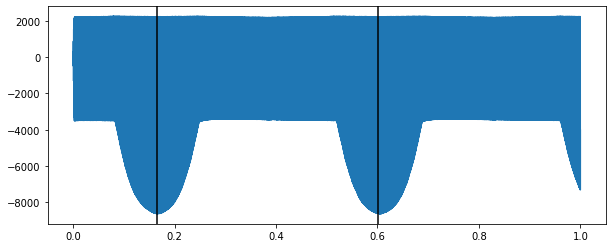

In [17]:
bitwig_loop_and_save_simple(
    input_file = "/home/soren/Dropbox/instruments/samples/vintage_synth_samples/roland_jupiter-8_vol1/Vintage Synth Samples - ROLAND JUPITER-8 VOL. 1 - 08 ROLAND JUPITER-8.wav",
    output_file = "vss_jupyter_08.multisample",
    start_range = [0.165, 0.17],
    stop_range = [0.6, 0.61],
    note_root = 60,   
)

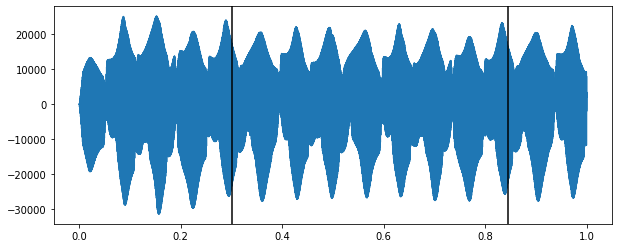

In [71]:
bitwig_loop_and_save_simple(
    input_file = "/home/soren/Dropbox/instruments/samples/vintage_synth_samples/roland_jupiter-8_vol1/modified/vss_jupiter8_10.wav",
    output_file = "vss_jupyter_10.multisample",
    start_range = [0.3, 0.4],
    stop_range = [0.845, 0.9],
    note_root = 60,   
)

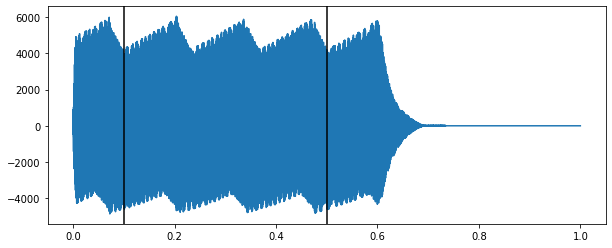

In [23]:
bitwig_loop_and_save_simple(
    input_file = "/home/soren/Dropbox/instruments/samples/vintage_synth_samples/roland_jupiter-8_vol1/Vintage Synth Samples - ROLAND JUPITER-8 VOL. 1 - 17 ROLAND JUPITER-8.wav",
    output_file = "vss_jupyter_17.multisample",
    start_range = [0.1, 0.3],
    stop_range = [0.5, 0.58],
    note_root = 60,   
)

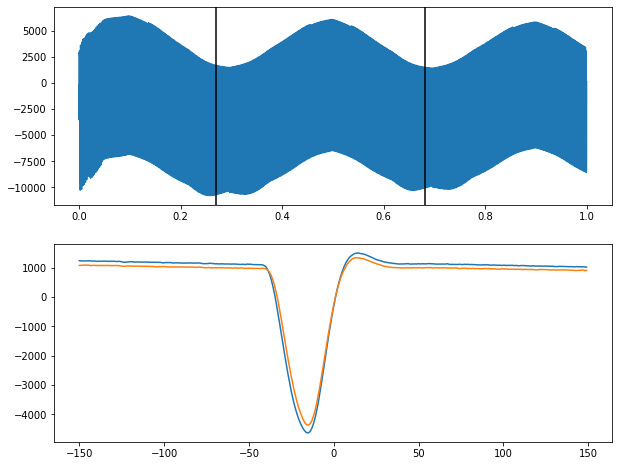

In [35]:
bitwig_loop_and_save_simple(
    input_file = "/home/soren/Dropbox/instruments/samples/vintage_synth_samples/roland_jupiter-8_vol1/Vintage Synth Samples - ROLAND JUPITER-8 VOL. 1 - 21 ROLAND JUPITER-8.wav",
    output_file = "vss_jupyter_21.multisample",
    start_range = [0.27, 0.30],
    stop_range = [0.68, 0.74],
    note_root = 36,   
)

Loop points: 60070, 106596


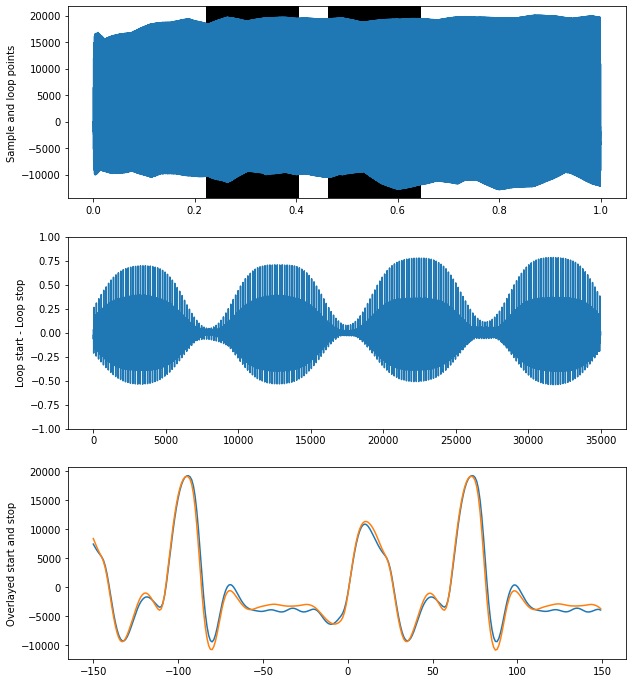

In [152]:
bitwig_loop_and_save_complex(
    input_file = "/home/soren/vcs/sbnsampler/app/sound/zebra_cello1_c4.wav",
    output_file = "zebra_cello1.multisample",
    start = 60000,
    overlap = 35000,
    note_root = 60,
)

Loop points: 100021, 175522


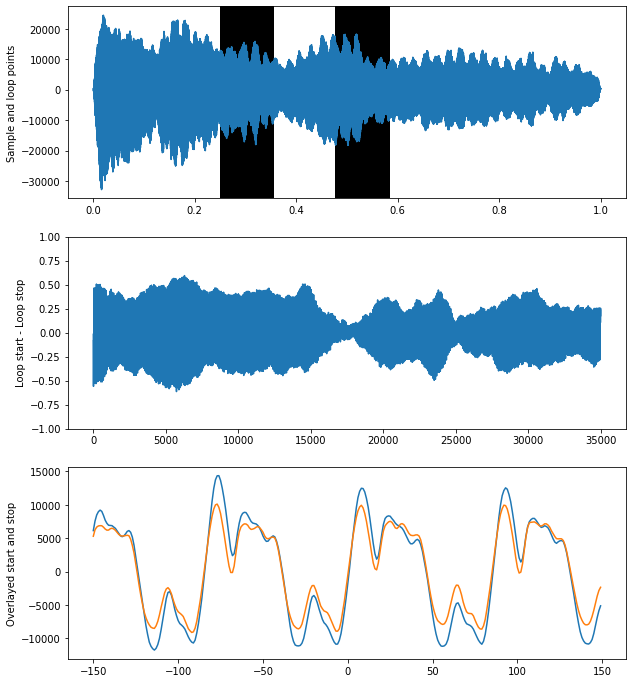

In [4]:
bitwig_loop_and_save_complex(
    input_file = "/home/soren/vcs/sbnsampler/app/sound/mellotron_m300b_c4.wav",
    output_file = "mellotron_m300b_c4.multisample",
    start = 100000,
    overlap = 35000,
    note_root = 60,
)


Loop points: 80016, 169112


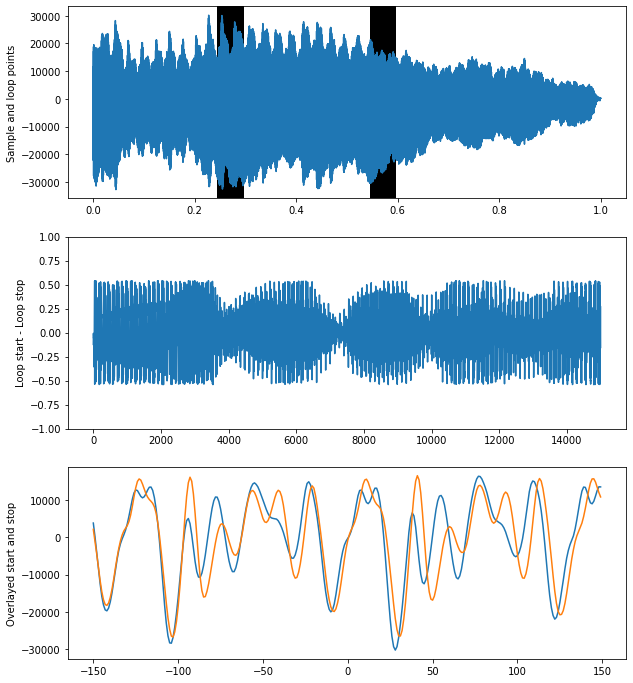

In [65]:
bitwig_loop_and_save_complex(
    input_file = "/home/soren/vcs/sbnsampler/app/sound/mellotron_m300b_e3.wav",
    output_file = "mellotron_m300b_e3.multisample",
    start = 80000,
    overlap = 15000,
    note_root = 52,
)
